# Library Usage in Seattle, 2005-2020

## Exploratory Data Analysis, Part II (time-based)

The data that is the basis for this project is the [Checkouts by Title (Physical Items)](https://data.seattle.gov/Community/Checkouts-By-Title-Physical-Items-/5src-czff) dataset from [Seattle Open Data](https://data.seattle.gov/). It was downloaded on December 15, 2020.

This notebook uses two datasets that were created in the [previous notebook](01_data_cleaning.ipynb), which I use to explore and analyze the types of items and the quantities of those items that were checked out from the Seattle Library system between 2005 and 2020.

*UPDATE*: I have since called the API (refer to [this notebook](0x_api_calls.ipynb)) to obtain the rest of the data for the year 2020. I then concatenated that data onto the final saved portion (what I have dubbed `seattle_lib_11.pkl`) of my very large DataFrame.

## Table of contents

1. [Import required packages](#Import-required-packages)
2. [Load data](#Load-data)
3. [Check for missing values](#Check-for-missing-values)
4. [Investigate missing values](#Investigate-missing-values)
    - [Missing values by year](#Missing-values-by-year)
    - [Missing values by day of week](#Missing-values-by-day-of-week)
    - [Missing values by day of week and year](#Missing-values-by-day-of-week-and-year)
    
    
5. [Checkouts over time](#Checkouts-over-time)

    - [Day of the week](#Day-of-the-week)
        - [Weekend](#Weekend)
        - [Holidays](#Holidays)
    - [2005-2020, overall](#2005-2020,-overall)
    - [2005-2020, yearly](#2005-2020,-yearly)
    - [Equipment](#Equipment)
    - [Print vs. Media](#Print-vs.-Media)
    
    
6. [Impute missing values](#Impute-missing-values)
7. [💾 Save/Load item counts DataFrame](#💾-Save/Load-item-counts-DataFrame)
8. [Next notebook: Modeling](#Next-notebook:-Modeling)

### Import required packages

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [1]:
# standard dataframe packages
import pandas as pd; pd.set_option('display.max_columns', 50)
import numpy as np

# graphing packages
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns; sns.set_style('ticks')

# time-related packages
import datetime
import holidays

# statistical packages
from scipy.stats import ttest_ind

# custom functions
from functions.data_cleaning import *

# saving packages
import gzip
import pickle

# reload functions/libraries when edited
%load_ext autoreload
%autoreload 2

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

### Load data

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

I'll load the item counts data. Again, this dataset was created in the [previous notebook](01_data_cleaning.ipynb).

For EDA based on the actual items checked out over the years, refer to [this notebook](02_eda_item.ipynb).

In [2]:
# load item counts data
df_counts = pd.read_pickle('data/seattle_lib_counts.pkl', compression='gzip')

In [3]:
# convert index to proper format
df_counts.index = pd.DatetimeIndex(df_counts.index)

In [4]:
# check shape
df_counts.shape

(5485, 31)

In [5]:
# take a look
df_counts.head()

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2005-04-13,16471,212,664,1.0,6397.0,32.0,10041.0,0.0,1874.0,63.0,217.0,308.0,9970.0,10.0,0.0,0.0,8.0,97.0,40.0,0.0,1950.0,1878.0,8189.0,32.0,370.0,6719.0,1143.0,18.0,11257.0,4613.0,601.0
2005-04-14,10358,123,541,1.0,4015.0,75.0,6267.0,0.0,1245.0,31.0,164.0,156.0,6225.0,7.0,0.0,0.0,8.0,85.0,28.0,0.0,1212.0,1115.0,5276.0,73.0,272.0,4104.0,621.0,12.0,6726.0,3381.0,251.0
2005-04-15,12896,179,508,0.0,5351.0,51.0,7494.0,0.0,1462.0,54.0,187.0,239.0,7452.0,12.0,0.0,0.0,4.0,80.0,35.0,0.0,1596.0,1721.0,6357.0,50.0,302.0,5166.0,1014.0,7.0,8795.0,3747.0,354.0
2005-04-16,1358,7,56,0.0,552.0,0.0,806.0,0.0,175.0,8.0,31.0,23.0,802.0,1.0,0.0,0.0,2.0,9.0,1.0,0.0,142.0,163.0,567.0,0.0,29.0,666.0,95.0,1.0,950.0,367.0,41.0
2005-04-17,4555,80,232,0.0,1555.0,8.0,2992.0,0.0,499.0,10.0,47.0,96.0,2946.0,9.0,0.0,0.0,7.0,19.0,27.0,0.0,395.0,480.0,2017.0,8.0,177.0,2145.0,203.0,5.0,3035.0,1349.0,171.0


### Check for missing values

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

- Based on the table below, it *appears* as if there are no NaN values in the current dataset, but I'll need to see if there are any days that are missing from the DataFrame entirely.
    - I've already checked if there are currently any NaN values, but haven't yet checked if there are any days that simply aren't in the dataset.
- There should be 263 days for 2005, since the data begins on April 13.
- All other years should have 365 or 366 days depending on whether it's a leap year.

In [6]:
# number of nans per column
pd.DataFrame(df_counts.isna().sum()).T

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen
0,0,0,0,0,0,0,0,15,0,15,0,15,0,15,0,15,0,0,0,0,0,15,0,0,0,0,0,15,0,0,0


In [7]:
# number of days per year
df_counts.groupby(df_counts.index.year).size()

date
2005    248
2006    363
2007    364
2008    364
2009    353
2010    351
2011    351
2012    347
2013    356
2014    358
2015    352
2016    356
2017    355
2018    354
2019    354
2020    259
dtype: int64

- Ouch! There are certainly missing values. I'll add in those missing days and fill their columns with NaN values.

In [8]:
# full range of days
idx = pd.date_range('2005-04-13', '2020-12-31')

# use full range and impute NaNs for missing days
df_counts = df_counts.reindex(idx, fill_value=np.nan)

In [9]:
# check new shape
df_counts.shape

(5742, 31)

In [10]:
# number of days per year
df_counts.groupby(df_counts.index.year).size()

2005    263
2006    365
2007    365
2008    366
2009    365
2010    365
2011    365
2012    366
2013    365
2014    365
2015    365
2016    366
2017    365
2018    365
2019    365
2020    366
dtype: int64

In [11]:
# number of nans per column
pd.DataFrame(df_counts.isna().sum()).T

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen
0,257,257,257,257,257,257,257,272,257,272,257,272,257,272,257,272,257,257,257,257,257,272,257,257,257,257,257,272,257,257,257


- I now have a dataset in which each day is accounted for; I filled in 257 days for which there was no information, imputing NaN values into every column for now.

### Investigate missing values

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

- Is there a particular year with a lot of missing values?
- Is there a particular day of the week with a lot of missing values?

#### Missing values by year

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [12]:
# dataframe of missing dates 
nan_vals = df_counts[df_counts.total_checkouts.isna()]

In [13]:
# create a year column (easier to call for groupby)
nan_vals['year'] = nan_vals.index.year

# missing days by year
days_missing_year = nan_vals.groupby('year').size()
days_missing_year

year
2005     15
2006      2
2007      1
2008      2
2009     12
2010     14
2011     14
2012     19
2013      9
2014      7
2015     13
2016     10
2017     10
2018     11
2019     11
2020    107
dtype: int64

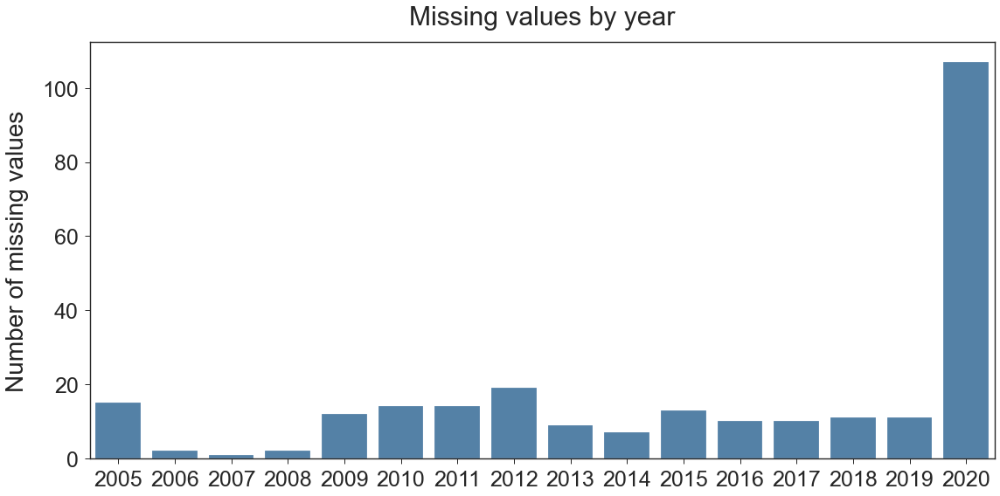

In [14]:
# create labels and prettify the plot
plt.figure(figsize=(16,8))
plt.title('Missing values by year', 
          fontsize=30, pad=20)

# plot counts
sns.barplot(days_missing_year.index, days_missing_year.values, color='steelblue')

# prettify graph
plt.ylabel('Number of missing values', fontsize=28, labelpad=15)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/missing_values_eda/missing_values_year_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- While each year does have missing values, all but 2020 have fewer than 19 days.
    - In the case of the leap year 2012, which has 19 missing days, that is about 5.2% of the data.
- It is important to note, however, that the data for 2005 is only partial, as it starts on April 13 of that year (thus having 263 days), so the percentage of missing values is slightly higher for that year (~5.7% of the data for that year). 
- There are 105 missing values for 2020! Given the pandemic, this is hardly surprising.
    - Missing values account for ~30.1% of the data in 2020!
    - *Note: 2020 data is also partial, ending on December 14, and should total 349 days.*
- Next, I'll take a look at the distribution of missing values for each day of the week by year.

#### Missing values by day of week

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [15]:
# column with name of day
nan_vals['day'] = nan_vals.index.day_name()

# missing days by day of week
days_missing_day = nan_vals.groupby('day').size()
days_missing_day

day
Friday       32
Monday       69
Saturday     29
Sunday       37
Thursday     36
Tuesday      27
Wednesday    27
dtype: int64

In [16]:
# list of days in order
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# reorder data for graph by week order
day_missing_values = [days_missing_day[day] for day in days]

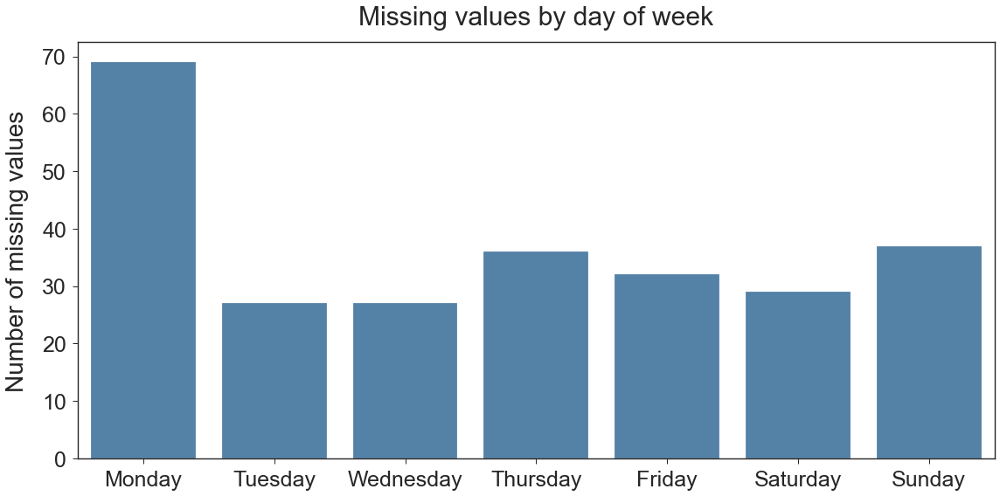

In [17]:
# create labels and prettify the plot
plt.figure(figsize=(16,8))
plt.title('Missing values by day of week', 
          fontsize=30, pad=20)

# plot counts
sns.barplot(days, day_missing_values, color='steelblue')

# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.ylabel('Number of missing values', fontsize=28, labelpad=15)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/missing_values_eda/missing_values_day_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Most of the missing values occur on Mondays, which may make sense if that is also a normally closed day in Seattle libraries (this is often the case in Brooklyn, at least).
- A fair amount of missing values for every other day as well.
- I'll have to figure out what to do with those, perhaps imputing the mean for the given year, or using the previous or following week's value.
- I'm curious how the distribution of missing values relates to day of the week *and* the year.

#### Missing values by day of week *and* year

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [18]:
# group by day and year
nan_vals_grouped = nan_vals.groupby(['day', 'year']).size()

# look at an example
nan_vals_grouped['Monday']

year
2005     3
2006     1
2009     2
2010     4
2011     4
2012     6
2013     4
2014     3
2015     2
2016     4
2017     5
2018     6
2019     5
2020    20
dtype: int64

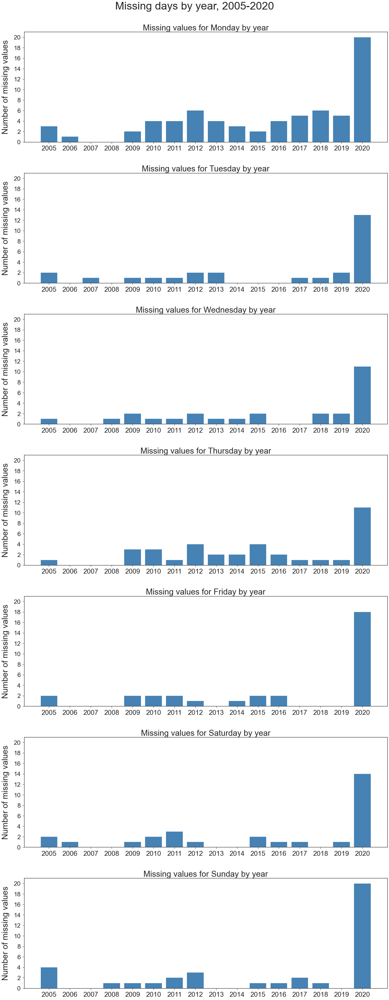

In [19]:
# instantiate figure
plt.figure(figsize=(20,50))

# set dimension of plots
nrows = 7
ncols = 1

# set title for entire figure
plt.suptitle('Missing days by year, 2005-2020', fontsize=40, y=1.02)

# for loop to visualize the health breakdown of these binary variables
for i, day in enumerate(days):

    day_missing_year = nan_vals_grouped[day]
    
    # plot
    plt.subplot(nrows, ncols, i+1)
    plt.title(f'Missing values for {day} by year', fontsize=30, x=0.5, y=1)
    plt.ylabel('Number of missing values', fontsize=30, labelpad=15)
    plt.xticks(ticks=[year for year in range(2005,2021)], labels=[year for year in range(2005,2021)], fontsize=25)
    plt.yticks(ticks=range(0,21,2), labels=range(0,21,2), fontsize=23)
    plt.ylim(bottom=0, top=21)
    plt.bar(day_missing_year.index, day_missing_year.values, color='steelblue')

# prepare to save and display
plt.tight_layout(h_pad=5)

# uncomment to save
plt.savefig('charts/missing_values_eda/missing_values_day_x_year_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- 2020 is consistently full of the most missing values for each day of the week, by far.
- For days other than Mondays, there are fewer than 4 missing values per year.

I'll eventually have to impute values in place of these NaNs, but for now, I'll look at the data that I actually have.

## Checkouts over time

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]]

First, I'll try to get a sense of the data by looking at descriptive statistics for each column.

In [20]:
# descriptive statistics
df_counts.describe()

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen
count,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5470.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5470.000000,5485.000000,5485.000000,5485.000000
mean,19431.490428,164.027530,300.798359,12.650684,8503.146582,36.569918,10879.123245,0.023583,2049.766454,8.399634,491.528897,43.935649,10842.907019,1.807313,0.087511,0.014808,4.357521,126.799088,23.808387,0.113765,5524.836463,269.553382,11912.460711,35.198906,306.592890,6849.029717,317.668915,10.497258,13060.923974,5657.308478,713.257976
std,6884.995882,108.927939,208.600858,22.932880,3661.566772,50.434238,3619.640586,0.221350,1101.291097,15.627219,218.604485,82.104667,3610.848989,3.984402,0.495419,0.165502,2.947570,49.890132,13.418199,0.620141,2435.003513,521.230672,4331.719313,50.737809,156.069815,2576.599179,269.939650,16.955717,4875.890843,2032.969838,311.975269
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15601.000000,90.000000,138.000000,0.000000,5900.000000,7.000000,8947.000000,0.000000,1169.000000,0.000000,335.000000,0.000000,8925.000000,0.000000,0.000000,0.000000,2.000000,99.000000,15.000000,0.000000,3922.000000,0.000000,9451.000000,6.000000,211.000000,5239.000000,162.000000,2.000000,10196.000000,4533.000000,516.000000
50%,19819.000000,181.000000,231.000000,0.000000,8346.000000,15.000000,11479.000000,0.000000,1929.000000,0.000000,483.000000,0.000000,11446.000000,0.000000,0.000000,0.000000,4.000000,131.000000,22.000000,0.000000,5351.000000,0.000000,12042.000000,13.000000,279.000000,6858.000000,227.000000,5.000000,13118.000000,5918.000000,676.000000
75%,23910.000000,248.000000,449.000000,20.000000,11005.000000,36.000000,13100.000000,0.000000,2859.000000,10.000000,651.000000,55.000000,13058.000000,2.000000,0.000000,0.000000,6.000000,160.000000,31.000000,0.000000,7237.000000,273.750000,14866.000000,34.000000,367.000000,8626.000000,345.000000,10.000000,16305.000000,6920.000000,908.000000
max,103560.000000,475.000000,1080.000000,125.000000,21234.000000,351.000000,82250.000000,8.000000,5530.000000,100.000000,1709.000000,488.000000,82170.000000,107.000000,15.000000,7.000000,20.000000,665.000000,175.000000,15.000000,17082.000000,2809.000000,68700.000000,351.000000,3170.000000,30642.000000,1648.000000,142.000000,48871.000000,48761.000000,5928.000000


- There appears to be at least one outlier, judging by the `max` row for the `total_checkouts` column.

In [21]:
# look at instance of max checkouts
df_counts[df_counts.total_checkouts > 40000]

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen
2020-03-13,103560.0,2.0,534.0,53.0,21234.0,23.0,82250.0,0.0,1831.0,0.0,1709.0,0.0,82170.0,0.0,0.0,0.0,16.0,665.0,51.0,0.0,17082.0,0.0,68700.0,14.0,3170.0,30642.0,1012.0,21.0,48871.0,48761.0,5928.0


- It appears there was a huge day of activity before locking down for the COVID-19 pandemic, what one may presume to describe as taking care of the backlog, i.e. getting out any outstanding orders.
- I'll remove this observation while looking at certain visualizations, as it will only skew something like a histogram far to the right.

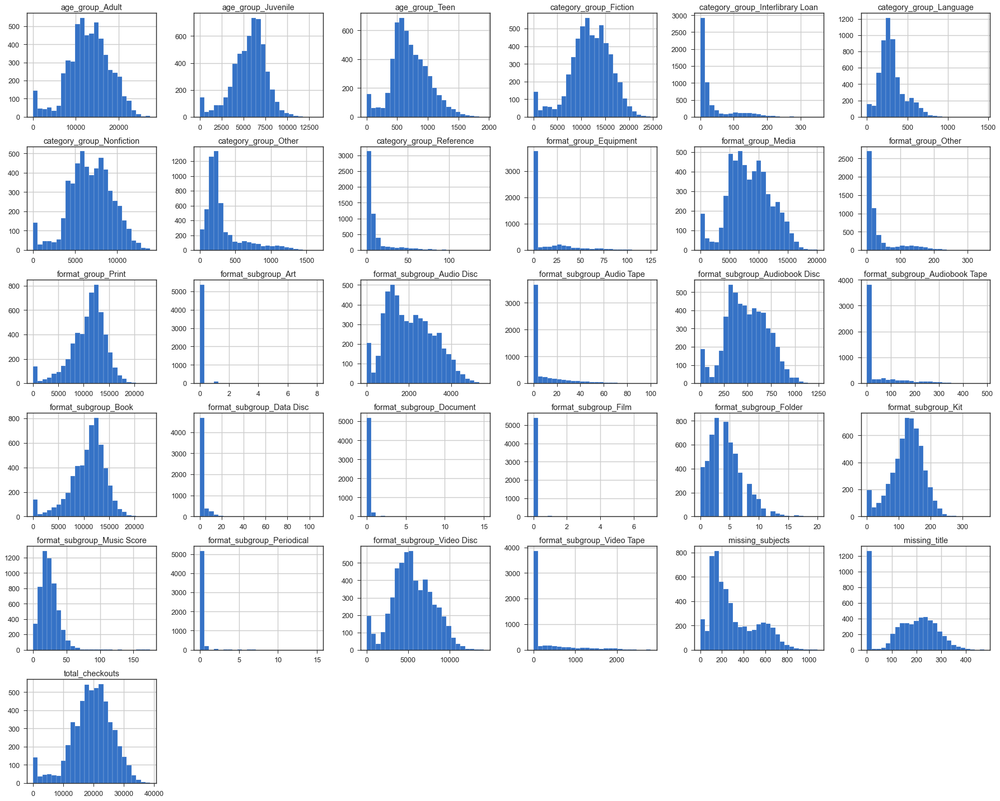

In [22]:
# histograms of every column, after removing one outlier
df_counts[df_counts.total_checkouts < 100000].hist(bins=25, figsize=(25,20))

plt.tight_layout()

plt.show()

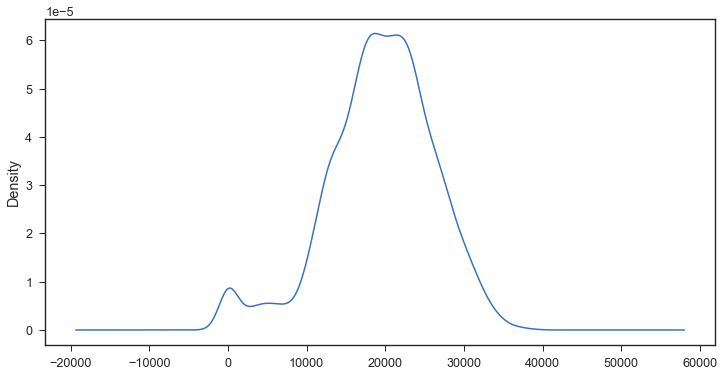

In [23]:
df_counts[df_counts.total_checkouts < 100000].total_checkouts.plot(kind='kde', figsize=(12,6))
plt.show()

- Many of the columns are fairly normally distributed, including the all-important `total_checkouts` column, which will be the basis of my time series analysis.
- There is a big spike in observations toward the very left of `total_checkouts` (toward 0), so I'll investigate that a little further here, first by looking at how many days had fewer than 100 checkouts.

In [24]:
# number of days with fewer than 100 checkouts
below100 = df_counts[df_counts.total_checkouts < 100].shape[0]
below100

115

In [25]:
# as a percentage
round(below100 / len(df_counts) * 100, 1)

2.0

- There were 115 days with fewer than 100 checkouts, which I'll have to investigate further.
    - Since libraries are generally closed on Sunday, one might expect this number to actually be higher, as there should be over 800 Sundays represented in the data. this must not merely be populated by Sundays (presumably a day on which the library is closed).
    - This accounts for 2.1% of the data.
- I'm curious to know how many of these occurred after the pandemic/lockdowns.

In [26]:
# number of days with fewer than 100 checkouts, in 2020
below100_2020 = df_counts[(df_counts.total_checkouts < 100) & (df_counts.index > '2020-03-01')].shape[0]
below100_2020

57

In [27]:
# as a percentage of days with fewer than 100 checkouts across all years
round(below100_2020 / below100 * 100, 1)

49.6

- Almost half of these days (57 days, or 49.6%) with very little activity occurred after March of 2020, which is no doubt a result of the pandemic.
- I'll double check there are no current NaN values.

### Day of the week

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [28]:
# column with name of day
df_counts['day'] = df_counts.index.day_name()

# take a look
df_counts.day.head()

2005-04-13    Wednesday
2005-04-14     Thursday
2005-04-15       Friday
2005-04-16     Saturday
2005-04-17       Sunday
Freq: D, Name: day, dtype: object

In [29]:
# average checkouts per day of week
day_counts_avg = df_counts.groupby('day').total_checkouts.mean()
day_counts_avg

day
Friday       16441.935279
Monday       21624.157124
Saturday     22352.677623
Sunday       11973.735632
Thursday     20552.349045
Tuesday      21331.998739
Wednesday    21762.551637
Name: total_checkouts, dtype: float64

In [30]:
# reorder using above list
day_avg_values = [day_counts_avg[day] for day in days]

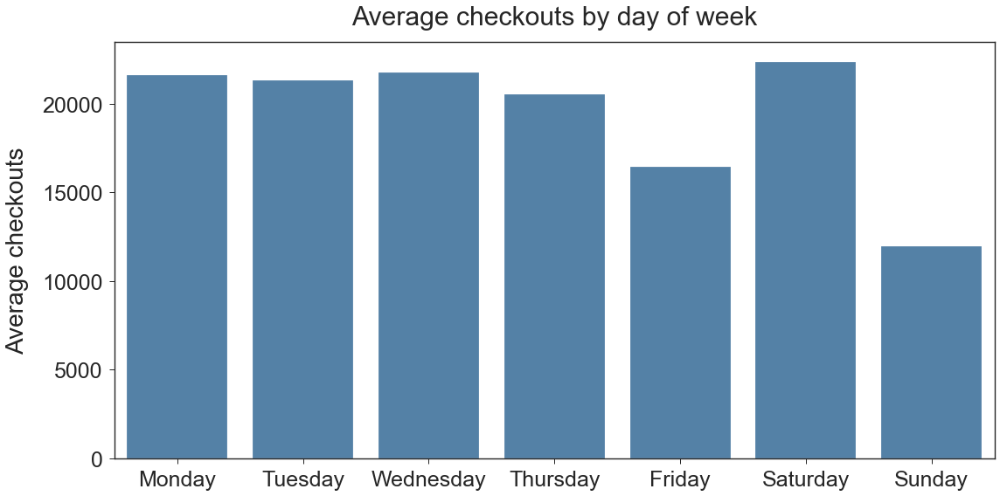

In [31]:
# create labels and prettify the plot
plt.figure(figsize=(16,8))
plt.title('Average checkouts by day of week', 
          fontsize=30, pad=20)

# plot counts
sns.barplot(days, day_avg_values, color='steelblue')

# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.ylabel('Average checkouts', fontsize=28, labelpad=15)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/average_checkouts_day_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Each day of the week has fairly similar numbers of average checkouts, other than Friday and Sunday, which appear much lower.
- I wonder if this changes over time. I'll look at these averages for each year.

In [32]:
# average checkouts by year and day
day_counts_avg_yearly = df_counts.groupby([df_counts.index.year, 'day']).total_checkouts.mean()

# reformat
day_counts_avg_yearly_unstack = day_counts_avg_yearly.unstack()[days]
day_counts_avg_yearly_unstack

day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
2005,16950.970588,17304.200000,19176.567568,15331.783784,15879.555556,15601.638889,5401.484848
2006,17541.901961,19134.903846,22869.269231,20063.846154,19089.634615,19812.843137,8499.924528
2007,18191.301887,20705.431373,23461.865385,22185.480769,19975.673077,21783.538462,10129.807692
2008,22363.923077,24071.716981,29255.596154,25379.730769,22318.230769,25189.442308,12242.745098
2009,26115.300000,27970.607843,31733.400000,28121.020000,25026.460000,27055.843137,13327.058824
2010,29334.291667,28724.843137,27146.980392,25966.183673,16830.745098,29052.280000,11455.137255
2011,26314.229167,26904.666667,25214.725490,23672.745098,15890.380000,25782.040000,11453.840000
2012,25970.063830,24570.700000,22809.940000,22572.770833,15612.078431,24870.666667,11227.720000
2013,25905.270833,23772.470588,22475.980392,23098.500000,16485.692308,26779.615385,16488.750000
2014,24622.775510,21791.826923,21431.730769,21704.380000,15526.098039,24935.326923,15174.057692


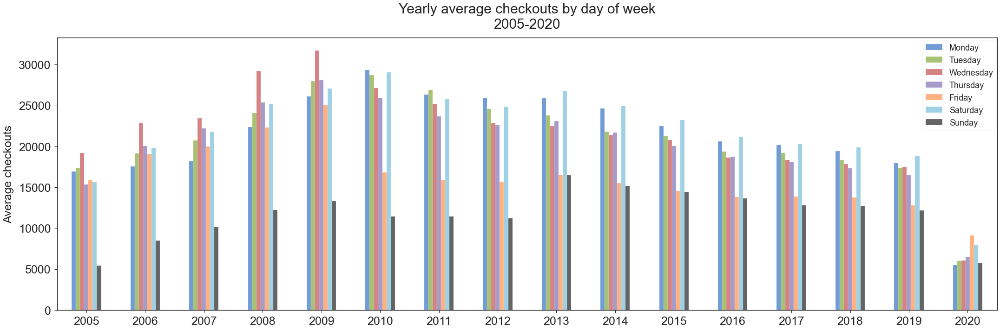

In [33]:
# plot the graph
day_counts_avg_yearly_unstack.plot(kind='bar',
    figsize=(30,10), 
    alpha=.70, fontsize=14)

# prettify the graph
plt.title('Yearly average checkouts by day of week\n2005-2020', 
          fontsize=30, pad=20)
plt.ylabel('Average checkouts', fontsize=25, labelpad=10)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25, rotation=0)
plt.legend(days, facecolor='white', 
           framealpha=1, bbox_to_anchor=(1.004, 1.005), 
           fontsize=18)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/yearly_weekday_average_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Wednesday is the top day between 2005-2009.
- Friday plays a strong role in those years as well.
    - It declines signficantly in 2010 and stays at that relative level.
    - Until 2020 when it becomes the top day on average
- Monday and Saturday are consistently toward the top from 2010 onward.
- Sunday is consistently the lowest day on average, although in 2020 it is comparatively similar to most other days (besides Friday and Saturday).


- I'll now start to graph checkouts across time, starting with raw counts for the entire stretch (2005-2020).

### Weekend

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [34]:
df_counts['weekend'] = np.where(df_counts.day.isin(['Saturday', 'Sunday']), 1, 0)
df_counts.weekend.value_counts()

0    4102
1    1640
Name: weekend, dtype: int64

In [35]:
# descriptive stats for weekend vs weekday checkouts
df_counts.groupby('weekend').total_checkouts.describe()

,count,mean,std,min,25%,50%,75%,max
weekend,,,,,,,,
0,3911.0,20333.756584,6569.128747,1.0,17080.00,20553.0,24286.0,103560.0
1,1574.0,17189.582592,7137.462879,1.0,12066.75,16445.5,22517.5,34694.0


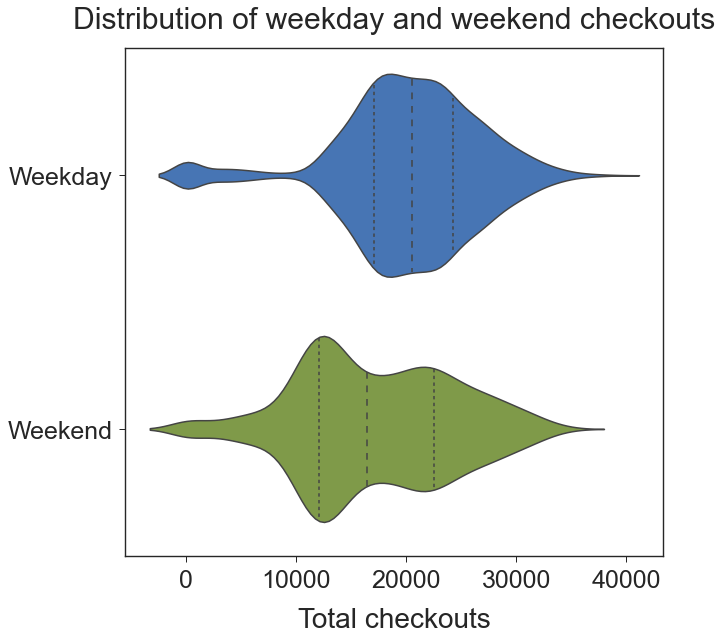

In [36]:
# create labels and prettify the plot
plt.figure(figsize=(10,9))
plt.title('Distribution of weekday and weekend checkouts', 
          fontsize=30, pad=20)

# plot
sns.violinplot(
    df_counts[df_counts.total_checkouts < 40000].total_checkouts,
    df_counts[df_counts.total_checkouts < 40000].weekend,
    inner='quartiles', orient='h'
)

# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.xlabel('Total checkouts', fontsize=28, labelpad=15)
plt.xticks(fontsize=25)
plt.ylabel('')
plt.yticks(ticks=range(2), labels=['Weekday', 'Weekend'], fontsize=25)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/checkouts_weekend_vs_weekday_violin.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Weekday checkouts are much closer to being normally distributed, whereas Weekend checkouts are bimodal.
- Weekend checkouts have a much larger range, especially when focusing on the interquartile range.
- The median value for Weekday checkouts is notably higher than Weekend checkouts.

I'll try to confirm if this is statistically significant using a two-sided t-test. In order to do this, it is best to remove that one pre-COVID outlier that has over 100k checkouts.

In [37]:
# two-sided t-test w/o outlier
ttest_ind(df_counts[(df_counts.total_checkouts < 40000) & (df_counts.weekend == 0)].total_checkouts,
          df_counts[(df_counts.total_checkouts < 40000) & (df_counts.weekend == 1)].total_checkouts)

Ttest_indResult(statistic=15.747737596120082, pvalue=1.1078015172165473e-54)

- This confirms that there is a statistically significant relationship between total checkouts on weekends and total checkouts on weekdays.
- I bet holidays are also important, since libraries tend to be closed or have shortened hours on those days, so I'll investigate that next.

### Month

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [38]:
# column with name of day
df_counts['month'] = df_counts.index.month_name()

# take a look
df_counts.month.head()

2005-04-13    April
2005-04-14    April
2005-04-15    April
2005-04-16    April
2005-04-17    April
Freq: D, Name: month, dtype: object

In [39]:
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
          'August', 'September', 'October', 'November', 'December']

In [40]:
# average checkouts per month
month_counts_avg = df_counts.groupby('month').total_checkouts.mean()
month_counts_avg[months]

month
January      20607.877506
February     20366.958937
March        20357.018018
April        19427.198661
May          18645.213362
June         20139.296703
July         20157.794372
August       19212.050314
September    18555.157080
October      18369.171371
November     19465.155361
December     18136.064240
Name: total_checkouts, dtype: float64

In [41]:
# reorder using above list
month_avg_values = [month_counts_avg[month] for month in months]

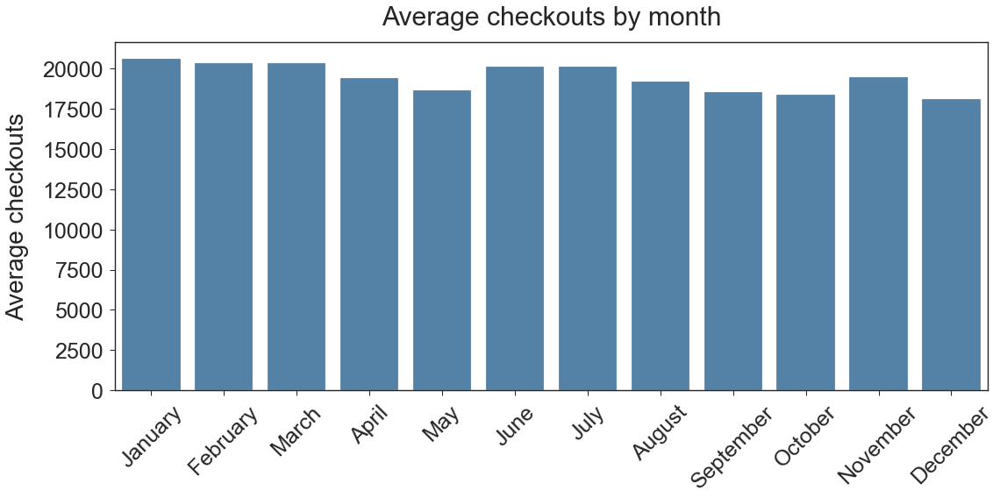

In [42]:
# create labels and prettify the plot
plt.figure(figsize=(16,8))
plt.title('Average checkouts by month', 
          fontsize=30, pad=20)

# plot counts
sns.barplot(months, month_avg_values, color='steelblue')

# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.ylabel('Average checkouts', fontsize=28, labelpad=15)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25, rotation=45)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/average_checkouts_month_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Each month has fairly similar numbers of average checkouts. The range between the months with the highest and lowest average checkouts is fairly small (~2,472):
    - December, the month with the least checkouts on average, has about 18,136 average checkouts per year.
    - January, the month with the most checkouts on average, has about 20,608 average checkouts per year.
- I wonder if this changes over time. I'll look at these averages for each year.

In [43]:
# average checkouts by year and month
month_counts_avg_yearly = df_counts.groupby([df_counts.index.year, 'month']).total_checkouts.mean()

# reformat
month_counts_avg_yearly_unstack = month_counts_avg_yearly.unstack()[months]
month_counts_avg_yearly_unstack

month,January,February,March,April,May,June,July,August,September,October,November,December
2005,NaN,NaN,NaN,13936.222222,14766.111111,16641.066667,16265.952381,11971.000000,14858.400000,15870.451613,16691.200000,15681.133333
2006,16839.483871,16959.964286,18298.612903,17142.366667,16286.451613,18087.966667,19285.225806,20214.548387,19396.500000,18947.225806,18832.533333,16934.758621
2007,18189.483871,18544.785714,19430.193548,19173.566667,18828.870968,20171.833333,19486.064516,20392.709677,19328.000000,20334.806452,20566.366667,19301.133333
2008,22158.580645,21985.241379,19655.066667,23311.966667,21754.322581,23902.000000,25003.483871,24220.838710,24063.100000,23113.645161,24358.533333,22482.400000
2009,25956.548387,25958.607143,26330.612903,25547.666667,24051.548387,26350.500000,25909.516129,26719.666667,25228.956522,24893.161290,25766.035714,24391.862069
2010,24787.096774,25222.814815,25215.290323,23916.200000,23476.266667,25008.733333,23487.322581,24365.517241,23693.166667,22170.645161,23742.750000,22982.413793
2011,23729.533333,23491.214286,20946.000000,23152.533333,21946.733333,23848.333333,23265.633333,23904.142857,20274.961538,20188.903226,21134.821429,20184.000000
2012,19717.750000,20359.142857,20331.516129,20113.433333,20290.900000,21831.333333,23015.566667,21941.346154,20498.576923,21227.645161,22464.321429,20643.482759
2013,23349.300000,23199.555556,21969.322581,21626.966667,20992.133333,22586.400000,23247.966667,22159.387097,21983.896552,20875.161290,22784.714286,20453.931034
2014,21381.225806,21664.000000,21894.677419,20457.400000,20245.833333,20938.966667,21624.466667,20454.677419,20183.379310,19663.806452,20542.655172,19574.827586


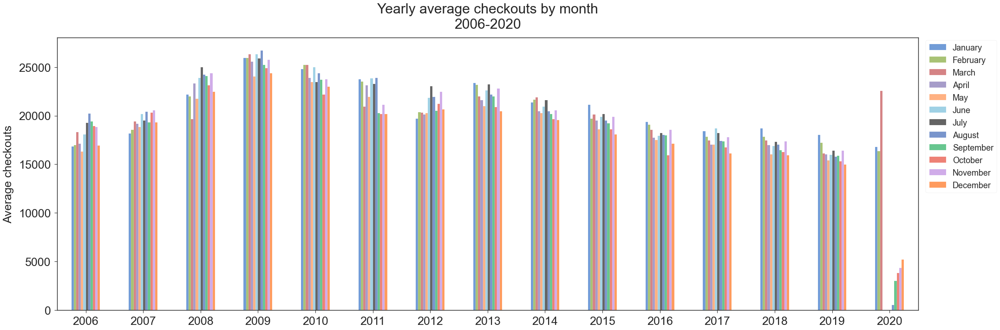

In [44]:
# plot the graph
month_counts_avg_yearly_unstack[month_counts_avg_yearly_unstack.index > 2005].plot(kind='bar',
    figsize=(30,10), 
    alpha=.70, fontsize=14)

# prettify the graph
plt.title('Yearly average checkouts by month\n2006-2020', 
          fontsize=30, pad=20)
plt.ylabel('Average checkouts', fontsize=25, labelpad=10)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25, rotation=0)
plt.legend(months, facecolor='white', 
           framealpha=1, bbox_to_anchor=(1.004, 1.005), 
           fontsize=18)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/yearly_month_average_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- It's a bit hard to gauge any distinct relationships in the above visualization, but a couple of things stick out to me.
    - January is generally toward the top
    - August was among the stronger months from 2006-2012, but then steadily fell in popularity, at least comparitively. Could this have something to do with how school-aged children interact with the library?
    - October and December are consistently two of the lowest performing months, while November consistently sees more activity compared to them.
    - 2020 once again proves to be very unique.

### Holidays

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

- First, I'll load a list of official holidays.
- Then I'll add on Christmas Eve for each year, since I found many of those days to not have any data.

In [45]:
# official holidays falling within date range of the dataset
holidays = holidays.US(state='WA', years=list(range(2005,2021)))[df_counts.index[0]: df_counts.index[-1]]

# number of such holidays
len(holidays)

174

In [46]:
# list of datetime objects for christmas eves for 2005-2020
xmas_eves = [datetime.strptime(f'{year}-12-24', '%Y-%m-%d').date() for year in range(2005,2021)]

# add to holidays list
holidays.extend(xmas_eves)

# number of (unique) holidays
len(set(holidays))

189

#### 💾 Save/Load list of holidays

In [47]:
# # uncomment to save
# with gzip.open('data/holidays_list.pkl', 'wb') as goodbye:
#     pickle.dump(holidays, goodbye, protocol=pickle.HIGHEST_PROTOCOL)

# # uncomment to load
# with gzip.open('data/holidays_list.pkl', 'rb') as hello:
#     holidays = pickle.load(hello)

In [48]:
# create holiday-or-not column
df_counts['holiday'] = np.where(df_counts.index.isin(holidays), 1, 0)

# count of non-holiday days (0) and holidays (1)
df_counts.holiday.value_counts()

0    5553
1     189
Name: holiday, dtype: int64

In [49]:
# missing days as it relates to non-holiday days (0) and holidays (1)
holiday_nans_count = df_counts[df_counts.total_checkouts.isna()].groupby('holiday').total_checkouts.size()
holiday_nans_count

holiday
0    148
1    109
Name: total_checkouts, dtype: int64

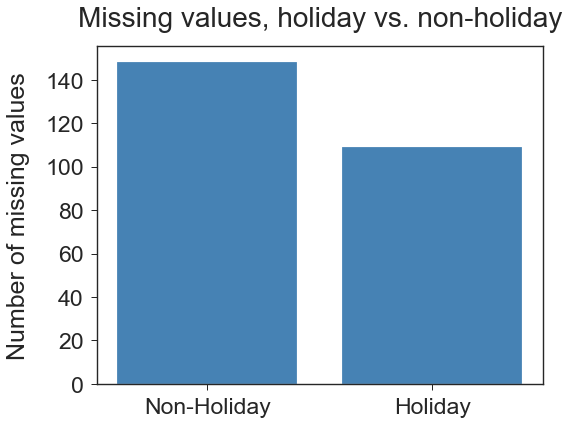

In [50]:
# create labels and prettify the plot
plt.figure(figsize=(8,6))
plt.title('Missing values, holiday vs. non-holiday', 
          fontsize=28, pad=20)
plt.suptitle('')
# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.ylabel('Number of missing values', fontsize=25, labelpad=15)
plt.xticks(ticks=range(2), labels=['Non-Holiday', 'Holiday'], fontsize=23)
plt.yticks(fontsize=23)

# plot counts
plt.bar(holiday_nans_count.index, holiday_nans_count.values, color='steelblue')

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/missing_values_eda/missing_values_holiday.png', 
            bbox_inches='tight', transparent=True)

plt.show()

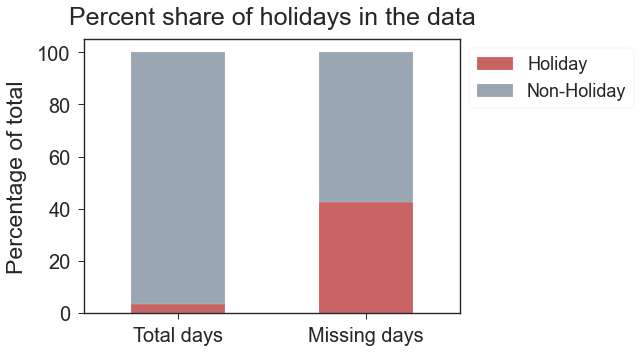

In [51]:
# prepare data for normalized stacked bar, sort by holiday values
holiday_unstack = pd.concat([df_counts.holiday.value_counts(normalize=True),
                             holiday_nans_count / sum(holiday_nans_count)],
                            axis=1).unstack().unstack()[[1,0]]

# plot stacked bar graph
p1 = holiday_unstack.plot(kind='bar', stacked=True, figsize=(9,5), color=['firebrick', 'slategrey'], alpha=0.7)

# prettify the graph
p1.set_title('Percent share of holidays in the data', fontsize=25, pad=15)
p1.set_xlabel('')
p1.set_xticklabels(labels=['Total days', 'Missing days'], fontsize=20, rotation=0)
p1.set_ylabel('Percentage of total', fontsize=23, labelpad=10)
p1.set_yticklabels(range(0,101,20), fontsize=20)
p1.legend(['Holiday', 'Non-Holiday'], bbox_to_anchor=(1,1), fontsize=18)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/missing_values_eda/missing_values_holiday_bar_stack.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Despite accounting for so few total days (about 3.3% of the data), holidays account for a large portion of all missing days (42.4%).
- This will play a large role when I impute values later on. As of now, I'm tempted to 0 out all missing days that are also a holiday, since the library is most likely closed on those days.

In [52]:
# number of missing days in 2020 that are *not* holidays
len(df_counts[(df_counts.total_checkouts.isna()) &\
              (df_counts.holiday == 0) &\
              (df_counts.index >= '2020-01-01')])

96

In [53]:
96 / 148

0.6486486486486487

- There are as nearly many missing days in 2020 that are *not* holidays as there are missing days that *are* holidays across the entire dataset.
    - These account for about 64.9% of all "Non-Holiday" missing days.
    - As of now, I'm tempted to 0 these out as well, since they are most likely days in which libraries were closed due to the pandemic.
- Now I want to see, for those holidays that do have data, how holiday checkouts compare to non-holiday checkouts.

In [54]:
# descriptive statistics
df_counts.groupby('holiday').total_checkouts.describe()

,count,mean,std,min,25%,50%,75%,max
holiday,,,,,,,,
0,5405.0,19609.127845,6673.054063,1.0,15715.0,19907.0,23961.00,103560.0
1,80.0,7429.862500,9825.736407,1.0,3.0,12.0,17650.75,26523.0


- Indeed, it looks like most holidays (at least half, judging by the median above) have very negligible values for `total_checkouts`.
    - These may be errors or spillover from previous days present in the data. Not necessarily worth further investigation for the scope of this project or changing to zero, although this could change as I progress with the project.
    - It may be worth looking into those values that have non-negligible values, however, as those may not actually be holidays.
- I'll visualize the above information below.

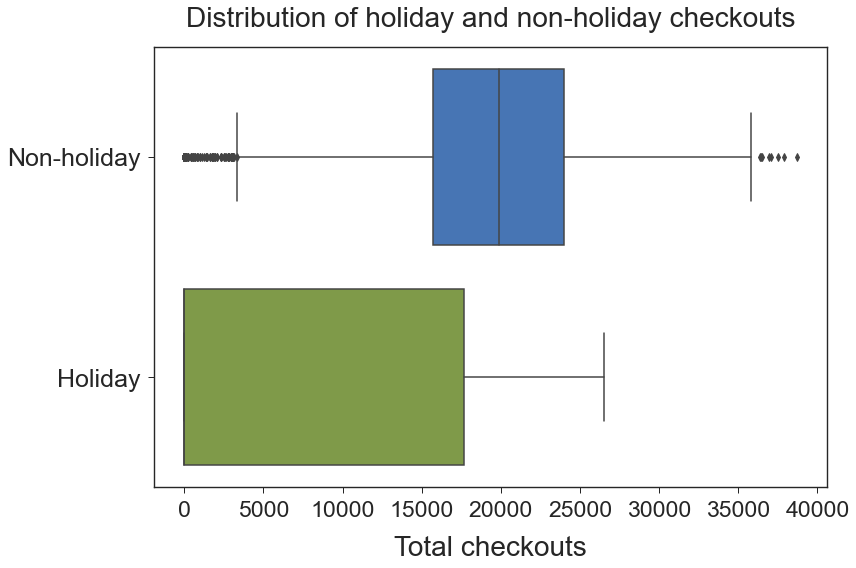

In [55]:
# create labels and prettify the plot
plt.figure(figsize=(12,8))
plt.title('Distribution of holiday and non-holiday checkouts', 
          fontsize=28, pad=20)

# plot
sns.boxplot(
    df_counts[df_counts.total_checkouts < 40000].total_checkouts,
    df_counts[df_counts.total_checkouts < 40000].holiday,
#     showfliers=False,
    orient='h'
)

# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.xlabel('Total checkouts', fontsize=28, labelpad=15)
plt.xticks(fontsize=23)
plt.ylabel('')
plt.yticks(ticks=range(2), labels=['Non-holiday', 'Holiday'], fontsize=25)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/checkouts_holiday_box.png', 
            bbox_inches='tight', transparent=True)

plt.show()

### 2005-2020, overall

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

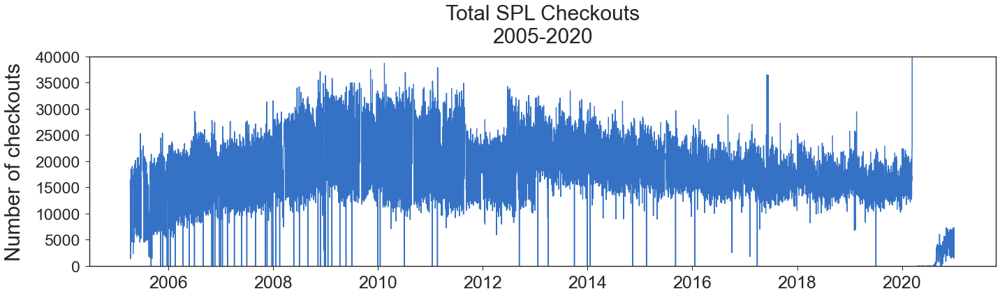

In [56]:
# instantiate figure
plt.figure(figsize=(20,6))

# prettify plot
plt.title(f'Total SPL Checkouts\n2005-2020', fontsize=30, pad=20)
plt.ylabel('Number of checkouts', fontsize=30, labelpad=15)
plt.xticks(fontsize=25)
plt.yticks(fontsize=23)
plt.ylim(bottom=0, top=40000)

# plot
plt.plot(df_counts.total_checkouts)

# prepare to save and display
plt.tight_layout()

# # uncomment to save
plt.savefig('charts/time-based_eda/total_checkouts_line.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- As mentioned earlier, more investigation will need to be done regarding the irregular and intermittent dips down toward 0 before 2020.
    - Note: these are *not* caused by the recently added NaN rows, as there are no points (and adjoining lines) associated with those dates in the above graph.
- Overall, the number of checkouts seems fairly consistent throughout the years, before the pandemic, peaking around 2009-2010.
    - There is a gradual trend of increasing checkouts between 2006 and 2010, and a gradual decrease after 2010.
- There is an interestingly "tighter range" toward the end of 2011 and the beginning of 2012.
- To get a sense of any larger trends, I'll look at bar graph of each year's total count, starting with 2006, since that is the first *complete* year in the data.

In [57]:
# total checkouts by year
year_totals = df_counts.groupby(df_counts.index.year).total_checkouts.agg('sum')
year_totals[1:]

2006    6575786.0
2007    7092007.0
2008    8374541.0
2009    9035838.0
2010    8425046.0
2011    7784795.0
2012    7299124.0
2013    7864260.0
2014    7416879.0
2015    6871626.0
2016    6404830.0
2017    6213798.0
2018    6020702.0
2019    5703704.0
2020    1728428.0
Name: total_checkouts, dtype: float64

In [58]:
# descriptive stats
year_totals[1:].describe()

count    1.500000e+01
mean     6.854091e+06
std      1.710840e+06
min      1.728428e+06
25%      6.309314e+06
50%      7.092007e+06
75%      7.824528e+06
max      9.035838e+06
Name: total_checkouts, dtype: float64

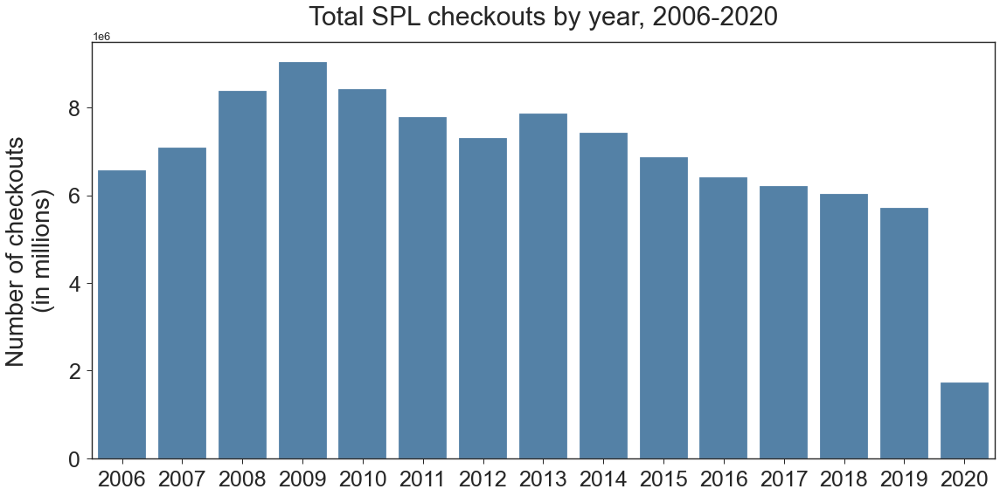

In [59]:
# create labels and prettify the plot
plt.figure(figsize=(16,8))
plt.title('Total SPL checkouts by year, 2006-2020', 
          fontsize=30, pad=20)

# plot counts
sns.barplot(year_totals[1:].index, year_totals[1:].values, color='steelblue')

# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.ylabel('Number of checkouts\n(in millions)', fontsize=28, labelpad=15)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/total_checkouts_yearly_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Indeed, outside of 2020, the numbers appear *fairly* consistent.
- 2008-2010 were the only years to receive over 8 million checkouts.
- There appears to be a fairly steady decline after 2013, with 2019 being the first year checkouts totaled fewer than 6 million.
- The impact of the pandemic is unsurprisingly huge.

### 2005-2020, yearly

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

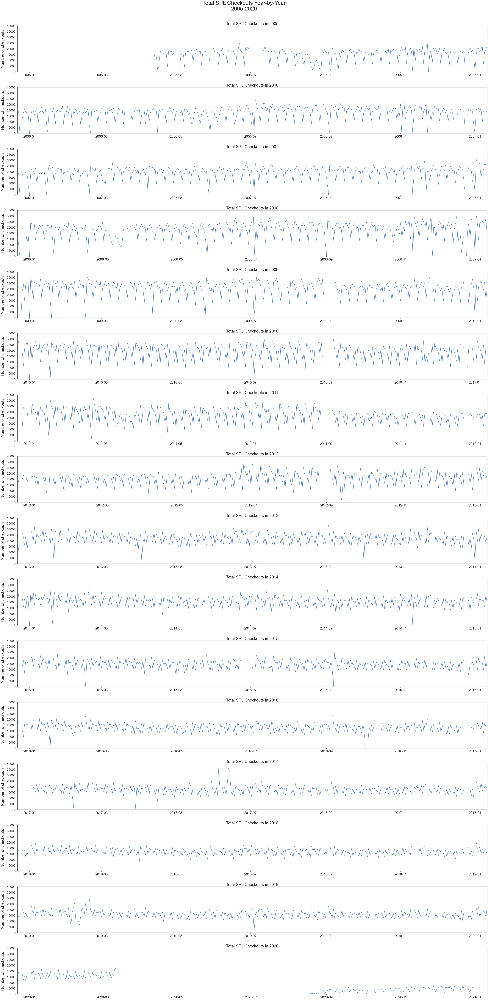

In [92]:
# instantiate figure
plt.figure(figsize=(50,100))

# set dimension of plots
nrows = 16
ncols = 1

# set title for entire figure
plt.suptitle('Total SPL Checkouts Year-by-Year\n2005-2020', fontsize=40, y=1.02)

# 10 days object, so i can add that to either side of the graph for a better view of the full year
buffer = pd.to_timedelta(10, unit='days')

# for loop to visualize the health breakdown of these binary variables
for i, year in enumerate(range(2005,2021)):
    
    begin = pd.to_datetime(f'{year}-01-01') - buffer
    end = pd.to_datetime(f'{year+1}-01-01') + buffer
    
    counts = df_counts[begin:end].total_checkouts
    
    # plot
    plt.subplot(nrows, ncols, i+1)
    plt.title(f'Total SPL Checkouts in {year}', fontsize=30, x=0.5, y=1)
    plt.ylabel('Number of checkouts', fontsize=30, labelpad=15)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=23)
    plt.xlim(left=begin, right=end)
    plt.ylim(bottom=0, top=40000)
    plt.plot(counts)


# prepare to save and display
plt.tight_layout(h_pad=5)

# # uncomment to save
plt.savefig('charts/time-based_eda/total_checkouts_yearly_line.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- In the years 2006 through 2010, as well as 2019, there is an apparent dip toward 0 checkouts on July 4 (presumably), but this same phenomenon is not seen from 2011 to 2018 (*note: due to COVID-19, not applicable in 2020*).

### Print vs. Media

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

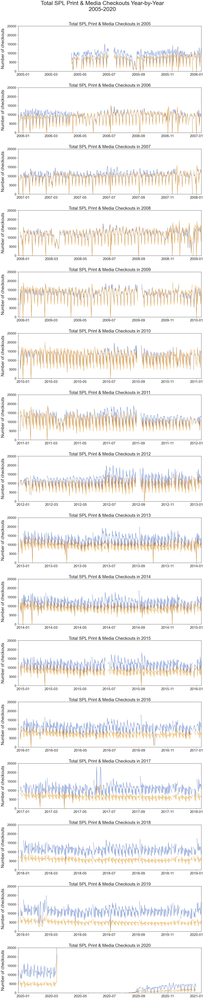

In [61]:
# instantiate figure
plt.figure(figsize=(20,95))

# set dimension of plots
nrows = 16
ncols = 1

# set title for entire figure
plt.suptitle('Total SPL Print & Media Checkouts Year-by-Year\n2005-2020', fontsize=40, y=1.02)

# 10 days object, so i can add that to either side of the graph for a better view of the full year
buffer = pd.to_timedelta(10, unit='days')

# for loop to visualize the health breakdown of these binary variables
for i, year in enumerate(range(2005,2021)):
    
    begin = pd.to_datetime(f'{year}-01-01') - buffer
    end = pd.to_datetime(f'{year+1}-01-01') + buffer
    
    counts_print = df_counts[begin:end].format_group_Print
    counts_media = df_counts[begin:end].format_group_Media
    
    # plot
    plt.subplot(nrows, ncols, i+1)
    plt.title(f'Total SPL Print & Media Checkouts in {year}', fontsize=30, x=0.5, y=1)
    plt.ylabel('Number of checkouts', fontsize=30, labelpad=15)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=23)
    plt.xlim(left=begin, right=end)
    plt.ylim(bottom=0, top=25000)
    plt.plot(counts_print, color='royalblue')
    plt.plot(counts_media, color='darkorange')
# 'darkorange', 'royalblue'

# prepare to save and display
plt.tight_layout(h_pad=5)

# uncomment to save
plt.savefig('charts/time-based_eda/total_print_media_checkouts_yearly_2005-2020_line.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Are Netflix and other streaming services disrupting the library's media services?

In [62]:
# total counts for print and media items
mp_totals = df_counts.groupby(df_counts.index.year)['format_group_Media','format_group_Print'].agg('sum')

# as a percent of the total checkouts by year
media_pct = mp_totals.format_group_Media / year_totals * 100
print_pct = mp_totals.format_group_Print / year_totals * 100

# convert to dataframe and take a look
mp_pct = pd.DataFrame(zip(media_pct, print_pct), columns=['Media', 'Print'], index=media_pct.index)
mp_pct

,Media,Print
2005,42.529270,57.002181
2006,47.744178,51.782585
2007,47.487897,52.019957
2008,50.162248,49.358359
2009,50.545893,49.148601
2010,49.498210,50.423072
2011,47.142770,52.790176
2012,44.990645,54.940963
2013,43.642746,56.274831
2014,43.397000,56.516211


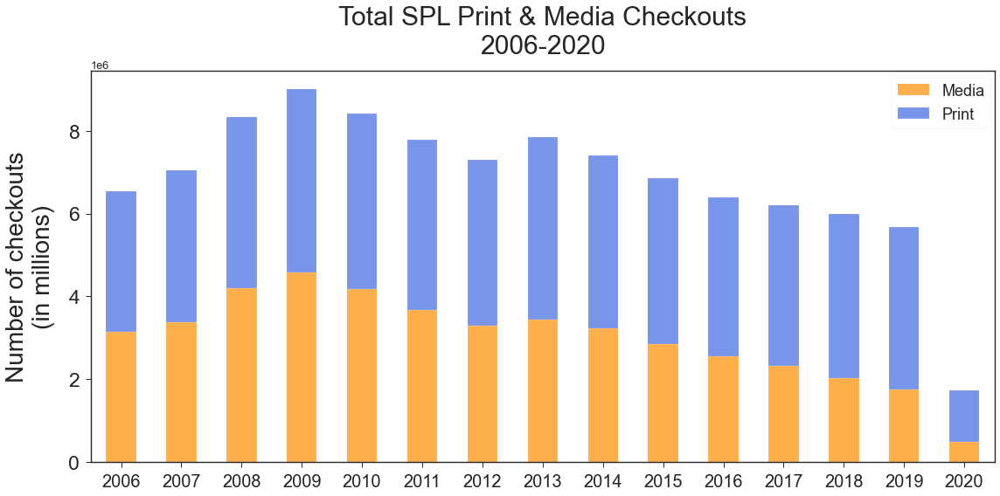

In [63]:
# plot the graph for total checkouts
mp_totals[1:].plot(kind='bar', stacked=True, 
    figsize=(16,8), color=['darkorange', 'royalblue'], 
    alpha=.70, fontsize=14)

# prettify the graph
plt.title('Total SPL Print & Media Checkouts\n2006-2020', 
          fontsize=30, pad=20)
plt.ylabel('Number of checkouts\n(in millions)', fontsize=28, labelpad=15)
plt.yticks(fontsize=23)
plt.xlabel('')
plt.xticks(fontsize=20, rotation=0)
plt.legend(['Media', 'Print'], facecolor='white', 
           framealpha=1, bbox_to_anchor=(1.005, 1.005), 
           fontsize=18)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/yearly_total_print_media_stackedbar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- It may be easier to visualize these numbers as a percentage of the total, which will also allow me to bring back in the data from 2005, since we aren't looking at the *total* checkouts.

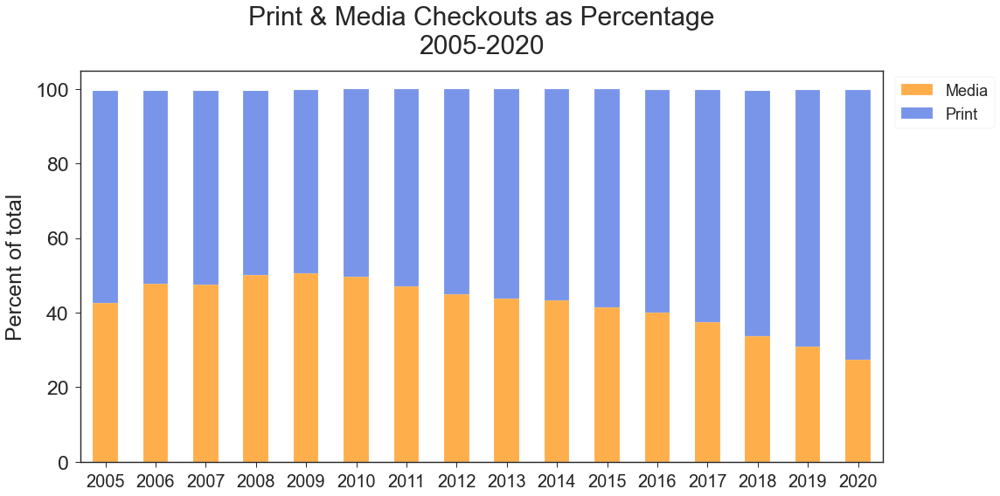

In [64]:
# plot the graph for percentage of total checkouts
mp_pct.plot(kind='bar', stacked=True, 
    figsize=(16,8), color=['darkorange', 'royalblue'], 
    alpha=.70, fontsize=14)

# prettify the graph
plt.title('Print & Media Checkouts as Percentage\n2005-2020', 
          fontsize=30, pad=20)
plt.ylabel('Percent of total', fontsize=25, labelpad=10)
plt.yticks(fontsize=23)
plt.xlabel('')
plt.xticks(fontsize=20, rotation=0)
plt.legend(['Media', 'Print'], facecolor='white', 
           framealpha=1, bbox_to_anchor=(1.005, 1.005), 
           fontsize=18)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/yearly_percent_print_media_stackedbar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- `Media` eclipses `Print` only during 2008 and 2009.
- `Media` checkouts (as a percentage of the total) decrease steadily year over year between 2010 and 2020, from around 50% of total checkouts in 2010 to 27.4% in 2020, presumably caused at least in part by the ubiquity of and advances within streaming platforms.

### Equipment

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

In [65]:
# total equipment checkouts by year
equip_totals = df_counts.groupby(df_counts.index.year).format_group_Equipment.agg('sum')
equip_totals

2005       18.0
2006        0.0
2007        0.0
2008        0.0
2009        0.0
2010        0.0
2011        0.0
2012        0.0
2013        0.0
2014        4.0
2015     2441.0
2016     9348.0
2017    12357.0
2018    22565.0
2019    17514.0
2020     5142.0
Name: format_group_Equipment, dtype: float64

In [66]:
# total counts for print and media items
equip_pct = equip_totals / year_totals * 100
equip_pct

2005    0.000477
2006    0.000000
2007    0.000000
2008    0.000000
2009    0.000000
2010    0.000000
2011    0.000000
2012    0.000000
2013    0.000000
2014    0.000054
2015    0.035523
2016    0.145952
2017    0.198864
2018    0.374790
2019    0.307064
2020    0.297496
dtype: float64

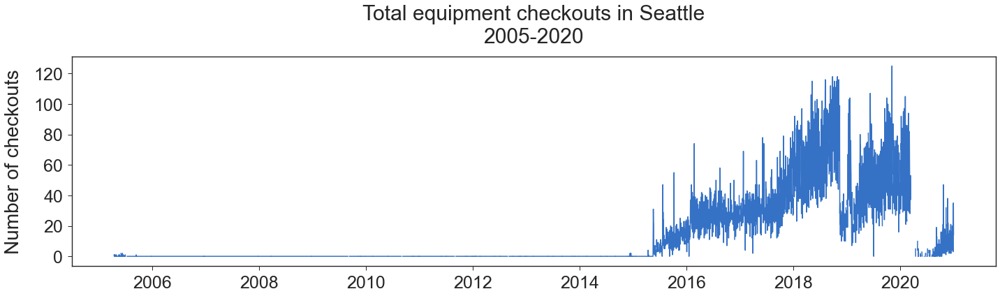

In [67]:
# create labels and prettify the plot
plt.figure(figsize=(20,6))
plt.title('Total equipment checkouts in Seattle\n2005-2020', 
          fontsize=30, pad=20)
plt.suptitle('')
# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.ylabel('Number of checkouts', fontsize=28, labelpad=15)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

# plot counts
plt.plot(df_counts.format_group_Equipment)

# prepare to save and display
plt.tight_layout()

# # uncomment to save
# plt.savefig('charts/time-based_eda/total_checkouts_equipment.png', 
#             bbox_inches='tight', transparent=True)

plt.show()

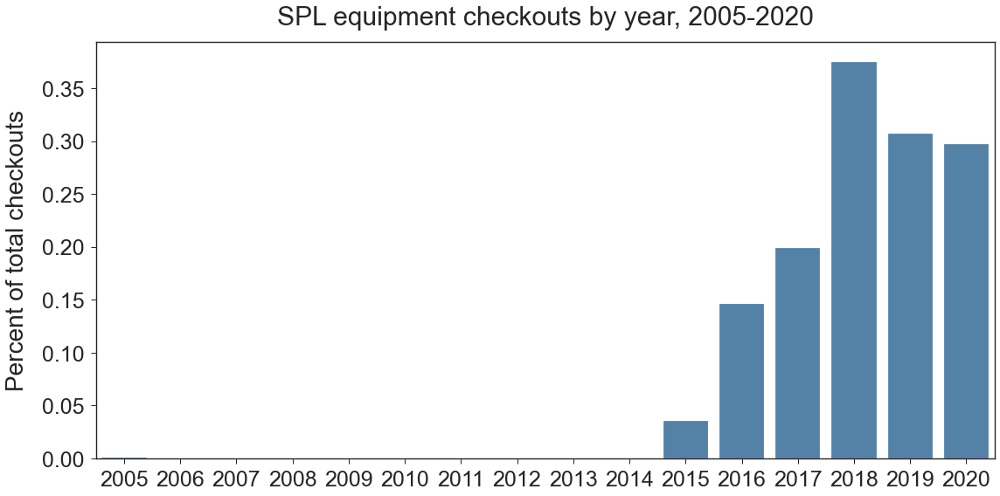

In [68]:
# create labels and prettify the plot
plt.figure(figsize=(16,8))
plt.title('SPL equipment checkouts by year, 2005-2020', 
          fontsize=30, pad=20)

# plot counts
sns.barplot(equip_pct.index, equip_pct.values, color='steelblue')

# plt.xlabel('Format', fontsize=28, labelpad=15)
plt.ylabel('Percent of total checkouts', fontsize=28, labelpad=15)
plt.yticks(fontsize=25)
plt.xlabel('')
plt.xticks(fontsize=25)

# prepare to save and display
plt.tight_layout()

# uncomment to save
plt.savefig('charts/time-based_eda/percent_checkouts_equipment_yearly_bar.png', 
            bbox_inches='tight', transparent=True)

plt.show()

- Equipment checkouts don't begin in earnest until sometime in 2015, although it should be noted that the daily numbers are comparatively low, with the maximum number being 125. The highest yearly total only makes up roughly 0.36% of the data for that year.
- I'll take a look at year-by-year starting in 2015.

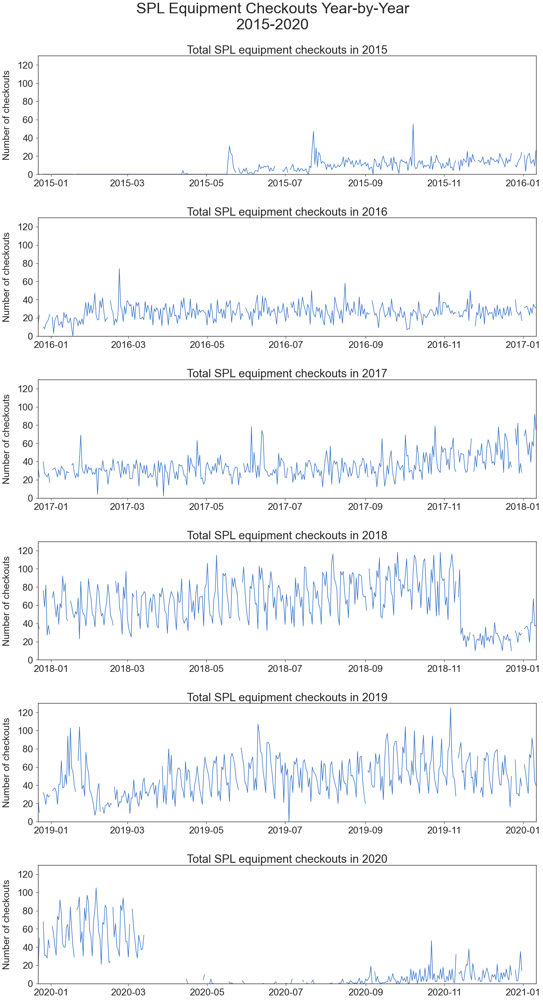

In [69]:
# instantiate figure
plt.figure(figsize=(20,35))

# set dimension of plots
nrows = 6
ncols = 1

# set title for entire figure
plt.suptitle('SPL Equipment Checkouts Year-by-Year\n2015-2020', fontsize=40, y=1.04)

# 10 days object, so i can add that to either side of the graph for a better view of the full year
buffer = pd.to_timedelta(10, unit='days')

# for loop to visualize the health breakdown of these binary variables
for i, year in enumerate(range(2015,2021)):
    
    begin = pd.to_datetime(f'{year}-01-01') - buffer
    end = pd.to_datetime(f'{year+1}-01-01') + buffer
    
    counts = df_counts[begin:end].format_group_Equipment
    
    # plot
    plt.subplot(nrows, ncols, i+1)
    plt.title(f'Total SPL equipment checkouts in {year}', fontsize=30, x=0.5, y=1)
    plt.ylabel('Number of checkouts', fontsize=25, labelpad=15)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)
    plt.xlim(left=begin, right=end)
    plt.ylim(bottom=0, top=130)
    plt.plot(counts)


# prepare to save and display
plt.tight_layout(h_pad=5)

# uncomment to save
plt.savefig('charts/time-based_eda/total_checkouts_equipment_yearly_2015-2020_line.png', 
            bbox_inches='tight', transparent=True)

plt.show()

## Impute missing values

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

- Impute zeroes for pandemic closure.
- Impute zeroes for holidays.
- Build function to imput average of 2 weeks prior, 1 week prior, 1 week after, and 2 weeks after.

In [70]:
# make a copy, so i retain an unimputed original
df_counts_imputed = df_counts.copy()

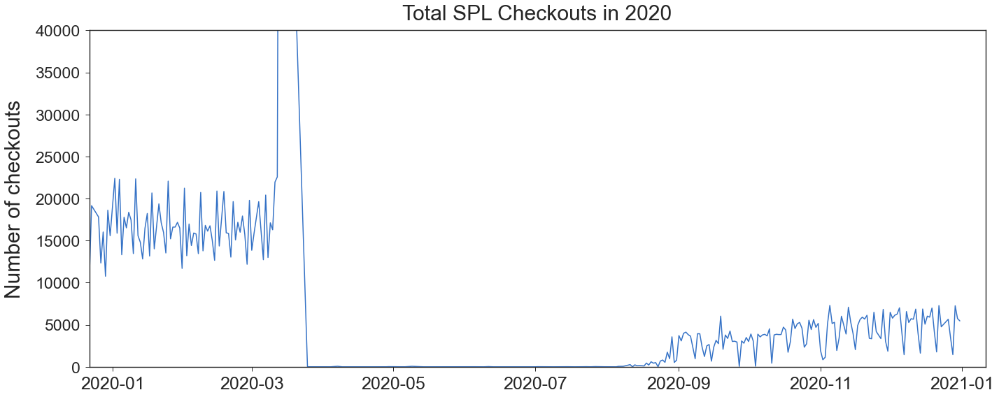

In [71]:
# instantiate figure
plt.figure(figsize=(20,8))

# 10 days object, so i can add that to either side of the graph for a better view of the full year
buffer = pd.to_timedelta(10, unit='days')
    
begin = pd.to_datetime(f'2020-01-01') - buffer
end = pd.to_datetime(f'2021-01-01') + buffer

counts = df_counts[begin:end].total_checkouts

# plot=
plt.title(f'Total SPL Checkouts in 2020', fontsize=30, pad=15, x=0.5, y=1)
plt.ylabel('Number of checkouts', fontsize=30, labelpad=15)
plt.xticks(fontsize=25)
plt.yticks(fontsize=23)
plt.xlim(left=begin, right=end)
plt.ylim(bottom=0, top=40000)
sns.lineplot(counts.index, counts.values)


# prepare to save and display
plt.tight_layout()

# # uncomment to save
plt.savefig('charts/time-based_eda/total_checkouts_2020.png', 
            bbox_inches='tight', transparent=True)

plt.show()

In [72]:
# replace pandemic NaNs with 0s
df_counts_imputed.loc['2020-03-14':'2020-09-01'] = df_counts_imputed.loc['2020-03-14':'2020-09-01'].fillna(0)

In [73]:
# replace holiday NaNs with 0s
df_counts_imputed[df_counts_imputed.index.isin(holidays)] = df_counts_imputed[df_counts.index.isin(holidays)].fillna(0)

In [74]:
# dataframe of still missing dates 
nan_vals_2 = df_counts_imputed[df_counts_imputed.total_checkouts.isna()]

In [75]:
# compare number of missing dates
len(nan_vals), len(nan_vals_2)

(257, 53)

In [76]:
# number of missing dates imputed so far
len(nan_vals) - len(nan_vals_2)

204

- Accounting for the pandemic and holidays took care of 204 missing dates.
- The remaining missing dates are often in stretches of consecutive days (uncomment and run the two code cells below to take a look), which may point to the data collection system having gone down or malfunctioning in some way.
- Checkout quantities for 53 missing dates still need to be imputed.
    - I'll take the average of 2 weeks prior, 1 week prior, 1 week after, and 2 weeks after.

In [77]:
# nan_vals_2.head(27)

In [78]:
# nan_vals_2.tail(26)

In [79]:
# numerical columns to impute
to_impute = list(df_counts_imputed.columns[:-4])

# categorical columns (already filled in for missing dates)
other_cols = list(df_counts_imputed.columns[-4:])

- I'll make a list of lists with those averages for each column, then convert to a DataFrame, then replace each missing date row with those averages.

In [80]:
%%time

# instantiate empty list
imputes = []

for i in nan_vals_2.index:
    temp = []
    temp.append(i)
    for col in to_impute:
        temp.append(imputer(df_counts_imputed, i, col, 2))
    for col in other_cols:
        temp.append(nan_vals_2.loc[i, col])
        
    imputes.append(temp)

# # add index (dates) to the list
# imputes.append(nan_vals_2.index)

# # impute average for each column, add to list
# for col in to_impute:
#     imputes.append([imputer(df_counts_imputed, i, col, 2) for i in nan_vals_2.index])

# # add categorical data to list
# for col in other_cols:
#     imputes.append(list(nan_vals_2[col]))

CPU times: user 4.24 s, sys: 69.8 ms, total: 4.31 s
Wall time: 4.35 s


In [81]:
# convert to dataframe
imputes_df = pd.DataFrame(imputes)

# set index column
imputes_df.set_index(0, inplace=True)

# set column names
imputes_df.columns = nan_vals_2.columns

In [82]:
imputes_df.head()

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen,day,weekend,month,holiday
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2005-05-01,5221.0,79.0,221.0,0.0,1781.0,6.0,3434.0,0.0,511.0,20.0,72.0,94.0,3399.0,5.0,0.0,0.0,5.0,31.0,23.0,0.0,482.0,565.0,2449.0,6.0,174.0,2344.0,242.0,5.0,3428.0,1576.0,217.0,Sunday,1,May,0
2005-05-02,18198.0,222.0,787.0,0.0,7548.0,87.0,10563.0,0.0,2252.0,71.0,309.0,328.0,10501.0,14.0,0.0,0.0,10.0,141.0,40.0,1.0,2281.0,2151.0,8664.0,86.0,398.0,7748.0,1286.0,16.0,12810.0,4851.0,537.0,Monday,0,May,0
2005-05-03,16144.0,168.0,686.0,0.0,6831.0,62.0,9250.0,0.0,2084.0,62.0,260.0,286.0,9194.0,10.0,0.0,0.0,13.0,106.0,34.0,0.0,2210.0,1813.0,7833.0,62.0,274.0,6880.0,1084.0,13.0,11563.0,4104.0,478.0,Tuesday,0,May,0
2005-07-01,17996.0,228.0,749.0,0.0,7771.0,70.0,10154.0,0.0,2140.0,57.0,328.0,367.0,10087.0,13.0,0.0,0.0,8.0,108.0,50.0,0.0,2722.0,2037.0,9396.0,69.0,390.0,6891.0,1238.0,12.0,12737.0,4669.0,590.0,Friday,0,July,0
2005-07-02,16740.0,201.0,686.0,0.0,6856.0,32.0,9852.0,0.0,2025.0,57.0,297.0,306.0,9801.0,10.0,0.0,0.0,10.0,109.0,38.0,0.0,2176.0,1875.0,8550.0,31.0,369.0,6654.0,1133.0,2.0,11738.0,4462.0,541.0,Saturday,1,July,0


In [83]:
# replace missing dates with above info
df_counts_imputed[df_counts_imputed.index.isin(nan_vals_2.index)] = imputes_df.copy()

In [84]:
# take a look
df_counts_imputed[df_counts_imputed.index.isin(nan_vals_2.index)].head()

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen,day,weekend,month,holiday
2005-05-01,5221.0,79.0,221.0,0.0,1781.0,6.0,3434.0,0.0,511.0,20.0,72.0,94.0,3399.0,5.0,0.0,0.0,5.0,31.0,23.0,0.0,482.0,565.0,2449.0,6.0,174.0,2344.0,242.0,5.0,3428.0,1576.0,217.0,Sunday,1,May,0
2005-05-02,18198.0,222.0,787.0,0.0,7548.0,87.0,10563.0,0.0,2252.0,71.0,309.0,328.0,10501.0,14.0,0.0,0.0,10.0,141.0,40.0,1.0,2281.0,2151.0,8664.0,86.0,398.0,7748.0,1286.0,16.0,12810.0,4851.0,537.0,Monday,0,May,0
2005-05-03,16144.0,168.0,686.0,0.0,6831.0,62.0,9250.0,0.0,2084.0,62.0,260.0,286.0,9194.0,10.0,0.0,0.0,13.0,106.0,34.0,0.0,2210.0,1813.0,7833.0,62.0,274.0,6880.0,1084.0,13.0,11563.0,4104.0,478.0,Tuesday,0,May,0
2005-07-01,17996.0,228.0,749.0,0.0,7771.0,70.0,10154.0,0.0,2140.0,57.0,328.0,367.0,10087.0,13.0,0.0,0.0,8.0,108.0,50.0,0.0,2722.0,2037.0,9396.0,69.0,390.0,6891.0,1238.0,12.0,12737.0,4669.0,590.0,Friday,0,July,0
2005-07-02,16740.0,201.0,686.0,0.0,6856.0,32.0,9852.0,0.0,2025.0,57.0,297.0,306.0,9801.0,10.0,0.0,0.0,10.0,109.0,38.0,0.0,2176.0,1875.0,8550.0,31.0,369.0,6654.0,1133.0,2.0,11738.0,4462.0,541.0,Saturday,1,July,0


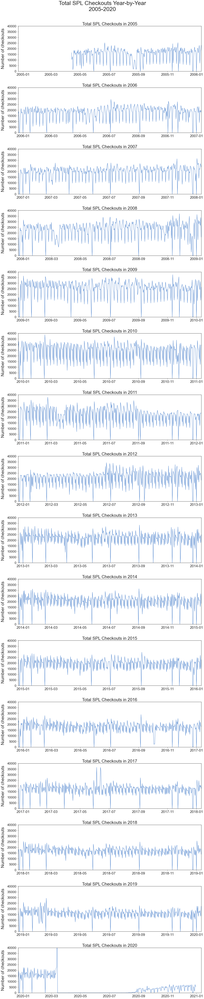

In [85]:
# instantiate figure
plt.figure(figsize=(20,95))

# set dimension of plots
nrows = 16
ncols = 1

# set title for entire figure
plt.suptitle('Total SPL Checkouts Year-by-Year\n2005-2020', fontsize=40, y=1.02)

# 10 days object, so i can add that to either side of the graph for a better view of the full year
buffer = pd.to_timedelta(10, unit='days')

# for loop to visualize the health breakdown of these binary variables
for i, year in enumerate(range(2005,2021)):
    
    begin = pd.to_datetime(f'{year}-01-01') - buffer
    end = pd.to_datetime(f'{year+1}-01-01') + buffer
    
    counts = df_counts_imputed[begin:end].total_checkouts
    
    # plot
    plt.subplot(nrows, ncols, i+1)
    plt.title(f'Total SPL Checkouts in {year}', fontsize=30, x=0.5, y=1)
    plt.ylabel('Number of checkouts', fontsize=30, labelpad=15)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=23)
    plt.xlim(left=begin, right=end)
    plt.ylim(bottom=0, top=40000)
    plt.plot(counts)


# prepare to save and display
plt.tight_layout(h_pad=5)

# # uncomment to save
plt.savefig('charts/time-based_eda/total_checkouts_yearly_line_after_imputing.png', 
            bbox_inches='tight', transparent=True)

plt.show()

In [86]:
# original
df_counts.describe()

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen,weekend,holiday
count,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5470.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5470.000000,5485.000000,5485.000000,5485.000000,5485.000000,5485.000000,5470.000000,5485.000000,5485.000000,5485.000000,5742.000000,5742.000000
mean,19431.490428,164.027530,300.798359,12.650684,8503.146582,36.569918,10879.123245,0.023583,2049.766454,8.399634,491.528897,43.935649,10842.907019,1.807313,0.087511,0.014808,4.357521,126.799088,23.808387,0.113765,5524.836463,269.553382,11912.460711,35.198906,306.592890,6849.029717,317.668915,10.497258,13060.923974,5657.308478,713.257976,0.285615,0.032915
std,6884.995882,108.927939,208.600858,22.932880,3661.566772,50.434238,3619.640586,0.221350,1101.291097,15.627219,218.604485,82.104667,3610.848989,3.984402,0.495419,0.165502,2.947570,49.890132,13.418199,0.620141,2435.003513,521.230672,4331.719313,50.737809,156.069815,2576.599179,269.939650,16.955717,4875.890843,2032.969838,311.975269,0.451746,0.178431
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15601.000000,90.000000,138.000000,0.000000,5900.000000,7.000000,8947.000000,0.000000,1169.000000,0.000000,335.000000,0.000000,8925.000000,0.000000,0.000000,0.000000,2.000000,99.000000,15.000000,0.000000,3922.000000,0.000000,9451.000000,6.000000,211.000000,5239.000000,162.000000,2.000000,10196.000000,4533.000000,516.000000,0.000000,0.000000
50%,19819.000000,181.000000,231.000000,0.000000,8346.000000,15.000000,11479.000000,0.000000,1929.000000,0.000000,483.000000,0.000000,11446.000000,0.000000,0.000000,0.000000,4.000000,131.000000,22.000000,0.000000,5351.000000,0.000000,12042.000000,13.000000,279.000000,6858.000000,227.000000,5.000000,13118.000000,5918.000000,676.000000,0.000000,0.000000
75%,23910.000000,248.000000,449.000000,20.000000,11005.000000,36.000000,13100.000000,0.000000,2859.000000,10.000000,651.000000,55.000000,13058.000000,2.000000,0.000000,0.000000,6.000000,160.000000,31.000000,0.000000,7237.000000,273.750000,14866.000000,34.000000,367.000000,8626.000000,345.000000,10.000000,16305.000000,6920.000000,908.000000,1.000000,0.000000
max,103560.000000,475.000000,1080.000000,125.000000,21234.000000,351.000000,82250.000000,8.000000,5530.000000,100.000000,1709.000000,488.000000,82170.000000,107.000000,15.000000,7.000000,20.000000,665.000000,175.000000,15.000000,17082.000000,2809.000000,68700.000000,351.000000,3170.000000,30642.000000,1648.000000,142.000000,48871.000000,48761.000000,5928.000000,1.000000,1.000000


In [87]:
# imputed
df_counts_imputed.describe()

,total_checkouts,missing_title,missing_subjects,format_group_Equipment,format_group_Media,format_group_Other,format_group_Print,format_subgroup_Art,format_subgroup_Audio Disc,format_subgroup_Audio Tape,format_subgroup_Audiobook Disc,format_subgroup_Audiobook Tape,format_subgroup_Book,format_subgroup_Data Disc,format_subgroup_Document,format_subgroup_Film,format_subgroup_Folder,format_subgroup_Kit,format_subgroup_Music Score,format_subgroup_Periodical,format_subgroup_Video Disc,format_subgroup_Video Tape,category_group_Fiction,category_group_Interlibrary Loan,category_group_Language,category_group_Nonfiction,category_group_Other,category_group_Reference,age_group_Adult,age_group_Juvenile,age_group_Teen,weekend,holiday
count,5742.000000,5742.000000,5742.000000,5742.000000,5742.000000,5742.000000,5742.000000,5727.000000,5742.000000,5727.000000,5742.000000,5727.000000,5742.000000,5727.000000,5742.000000,5727.000000,5742.000000,5742.000000,5742.000000,5742.000000,5742.000000,5727.000000,5742.000000,5742.000000,5742.000000,5742.000000,5742.000000,5727.000000,5742.000000,5742.000000,5742.000000,5742.000000,5742.000000
mean,18744.419714,158.519157,290.782132,12.129920,8202.678858,35.137583,10494.472135,0.022525,1977.755138,8.144229,474.520550,42.649729,10459.508011,1.752052,0.083943,0.014144,4.212818,122.291014,22.974051,0.109370,5327.042146,261.418195,11490.889063,33.819401,295.620341,6606.758621,307.197144,10.092544,12600.285092,5455.354406,688.781087,0.285615,0.032915
std,7655.623396,111.123037,212.525064,22.590965,3922.876190,49.848241,4083.438832,0.216380,1144.759543,15.492795,233.520378,81.608867,4072.635978,3.935072,0.485200,0.161774,3.005016,54.278140,13.864934,0.607007,2602.098029,517.103108,4791.762965,50.107186,163.155368,2827.711904,272.904941,16.729312,5361.971099,2252.574810,333.905679,0.451746,0.178431
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14896.500000,4.000000,131.000000,0.000000,5654.500000,6.000000,8601.250000,0.000000,1107.250000,0.000000,322.000000,0.000000,8573.750000,0.000000,0.000000,0.000000,2.000000,94.000000,14.000000,0.000000,3757.750000,0.000000,9082.250000,5.000000,201.000000,5002.000000,154.000000,2.000000,9791.500000,4354.250000,500.250000,0.000000,0.000000
50%,19503.000000,175.000000,224.000000,0.000000,8125.500000,14.000000,11354.500000,0.000000,1851.500000,0.000000,472.000000,0.000000,11317.000000,0.000000,0.000000,0.000000,4.000000,129.000000,22.000000,0.000000,5229.500000,0.000000,11817.500000,12.000000,274.000000,6711.000000,223.000000,4.000000,12857.000000,5829.000000,663.000000,0.000000,0.000000
75%,23754.000000,245.750000,436.000000,18.000000,10916.000000,34.000000,13049.000000,0.000000,2818.500000,9.000000,647.000000,50.000000,13007.500000,1.000000,0.000000,0.000000,6.000000,159.000000,31.000000,0.000000,7158.750000,247.000000,14756.750000,32.000000,363.000000,8562.500000,332.750000,10.000000,16165.250000,6887.750000,898.750000,1.000000,0.000000
max,103560.000000,475.000000,1080.000000,125.000000,21234.000000,351.000000,82250.000000,8.000000,5530.000000,100.000000,1709.000000,488.000000,82170.000000,107.000000,15.000000,7.000000,20.000000,665.000000,175.000000,15.000000,17082.000000,2809.000000,68700.000000,351.000000,3170.000000,30642.000000,1648.000000,142.000000,48871.000000,48761.000000,5928.000000,1.000000,1.000000


### 💾 Save/Load item counts DataFrame 

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

- I'll save both the dataset with missing values and that with imputed values.

In [88]:
# # uncomment to save imputed
# df_counts_imputed.to_pickle(f'data/seattle_lib_counts_imputed.pkl', compression='gzip')

# # uncomment to load imputed
# df_imputed = pd.read_pickle('data/seattle_lib_counts_imputed.pkl', compression='gzip')

In [89]:
# # uncomment to save unimputed
# df_counts.to_pickle(f'data/seattle_lib_counts_unimputed.pkl', compression='gzip')

# # uncomment to load unimputed
# df_unimputed = pd.read_pickle('data/seattle_lib_counts_unimputed.pkl', compression='gzip')

# Next notebook: [Modeling](03_modeling.ipynb)

[[go back to the top](#Library-Usage-in-Seattle,-2005-2020)]

- The next notebook includes time series modeling, forecasts, and breakdowns of seasonality and trends.